# **Problem 3, Parts D-F: Stochastic Gradient Descent Visualization**

In this Jupyter notebook, we visualize how SGD works. This visualization corresponds to parts D-F of question 3 in set 1.

Use this notebook to write your code for problem 3 parts D-F by filling in the sections marked # TODO and running all cells.

In [ ]:
# Install a package
!apt-get update
!apt install imagemagick

Hit:1 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Get:5 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:6 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [83.3 kB]
Ign:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:9 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:12 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:13 http://archive.ubuntu.com/ubuntu b

In [ ]:
# Setup.

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML, Image
from matplotlib import animation, rc

import urllib.request
urllib.request.urlretrieve('https://raw.githubusercontent.com/emiletimothy/Caltech-CS155-2023/main/set1/src/sgd_helper.py', 'sgd_helper.py')

from sgd_helper import (
    generate_dataset1,
    generate_dataset2,
    plot_dataset,
    plot_loss_function,
    animate_convergence,
    animate_sgd_suite
)

# Problem 3D: Implementation of SGD

Fill in the loss, gradient, and SGD functions according to the guidelines given in the problem statement in order to perform SGD.

In [ ]:
def loss(X, Y, w):
    '''
    Calculate the squared loss function.

    Inputs:
        X: A (N, D) shaped numpy array containing the data points.
        Y: A (N, ) shaped numpy array containing the (float) labels of the data points.
        w: A (D, ) shaped numpy array containing the weight vector.

    Outputs:
        The loss evaluated with respect to X, Y, and w.
    '''

    #==============================================
    # TODO: Implement the SGD loss function.
    #==============================================

    loss_score = 0
    for i in range(len(X)):
      loss_score += (Y[i] - np.dot(np.transpose(w), X[i]))**2
    return loss_score

def gradient(x, y, w):
    '''
    Calculate the gradient of the loss function with respect to the weight vector w,
    evaluated at a single point (x, y) and weight vector w.

    Inputs:
        x: A (D, ) shaped numpy array containing a single data point.
        y: The float label for the data point.
        w: A (D, ) shaped numpy array containing the weight vector.

    Output:
        The gradient of the loss with respect to w.
    '''

    #==============================================
    # TODO: Implement the gradient of the
    # loss function.
    #==============================================

    return 2*x*(np.dot(np.transpose(w), x) - y)


def SGD(X, Y, w_start, eta, N_epochs):
    '''
    Perform SGD using dataset (X, Y), initial weight vector w_start,
    learning rate eta, and N_epochs epochs.

    Inputs:
        X: A (N, D) shaped numpy array containing the data points.
        Y: A (N, ) shaped numpy array containing the (float) labels of the data points.
        w_start:  A (D, ) shaped numpy array containing the weight vector initialization.
        eta: The step size.
        N_epochs: The number of epochs (iterations) to run SGD.

    Outputs:
        W: A (N_epochs, D) shaped array containing the weight vectors from all iterations.
        losses: A (N_epochs, ) shaped array containing the losses from all iterations.
    '''

    #==============================================
    # TODO: Implement the SGD algorithm.
    #==============================================

    loss_arr = []
    w_vec = []
    w = np.array(w_start)
    for i in range(N_epochs):
      random_data_idx = np.random.permutation(range(len(X)))
      for j in random_data_idx:
        w = w - eta * gradient(X[j], Y[j], w)
      w_vec.append(w)
      loss_arr.append(loss(X,Y,w))
    return w_vec , loss_arr

# Problem 3E: Visualization

## Dataset

We'll start off by generating two simple 2-dimensional datasets. For simplicity we do not consider separate training and test sets.

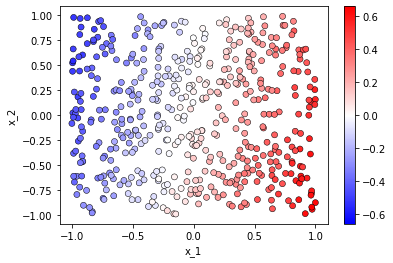

In [ ]:
X1, Y1 = generate_dataset1()
plot_dataset(X1, Y1)

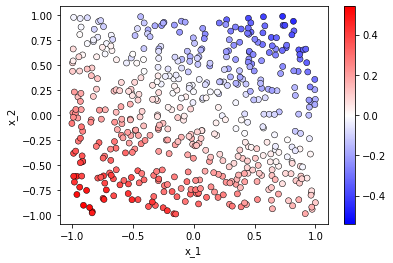

In [ ]:
X2, Y2 = generate_dataset2()
plot_dataset(X2, Y2)

# SGD from a single point
First, let's visualize SGD from a single starting point:

Performing SGD with parameters {'w_start': [0.01, 0.01], 'eta': 1e-05} ...

Animating...


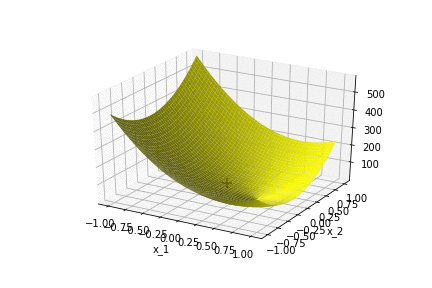

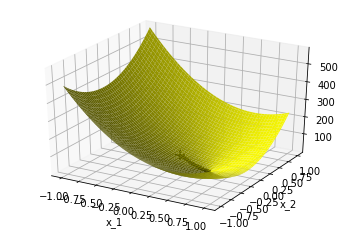

In [ ]:
# Parameters to feed the SGD.
#  changes the animation speed.
params = ({'w_start': [0.01, 0.01], 'eta': 0.00001},)
N_epochs = 1000
FR = 20

# Let's animate it!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR)

anim.save('animation1.gif', fps=30, writer='imagemagick')
Image(open('animation1.gif','rb').read())

Let's view how the weights change as the algorithm converges:


Animating...


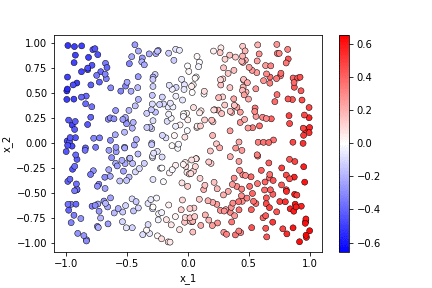

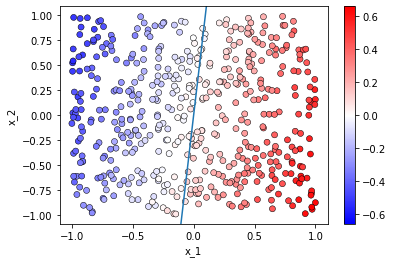

In [ ]:
# Parameters to feed the SGD.
params = ({'w_start': [0.01, 0.01], 'eta': 0.00001},)
N_epochs = 1000
FR = 20

# Let's do it!
W, _ = SGD(X1, Y1, params[0]['w_start'], params[0]['eta'], N_epochs)
anim = animate_convergence(X1, Y1, W, FR)
anim.save('animation2.gif', fps=30, writer='imagemagick')
Image(open('animation2.gif','rb').read())

# SGD from multiple points

Now, let's visualize SGD from multiple arbitrary starting points:



Performing SGD with parameters {'w_start': [-0.8, -0.3], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.9, 0.4], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.4, 0.9], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [0.8, 0.8], 'eta': 1e-05} ...

Animating...


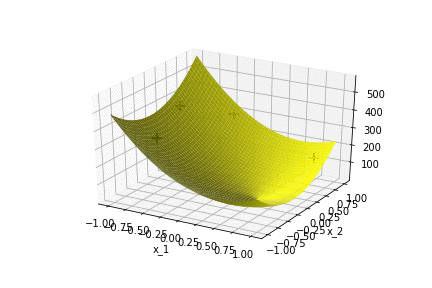

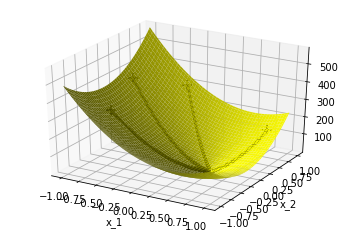

In [ ]:
# Parameters to feed the SGD.
# Here, we specify each different set of initializations as a dictionary.
params = (
    {'w_start': [-0.8, -0.3], 'eta': 0.00001},
    {'w_start': [-0.9, 0.4], 'eta': 0.00001},
    {'w_start': [-0.4, 0.9], 'eta': 0.00001},
    {'w_start': [0.8, 0.8], 'eta': 0.00001},
)
N_epochs = 1000
FR = 20

# Let's go!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR)
anim.save('animation3.gif', fps=30, writer='imagemagick')
Image(open('animation3.gif','rb').read())

Let's do the same thing but with a different dataset:

Performing SGD with parameters {'w_start': [-0.8, -0.3], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.9, 0.4], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.4, 0.9], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [0.8, 0.8], 'eta': 1e-05} ...

Animating...


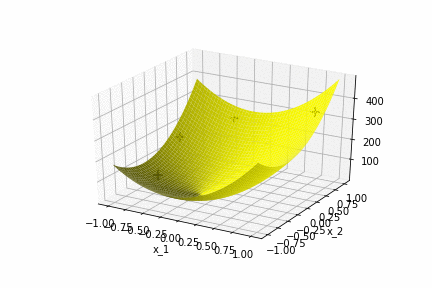

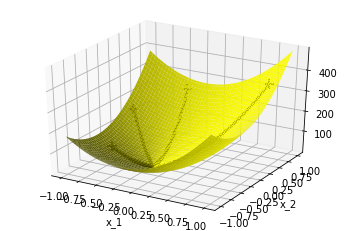

In [ ]:
# Parameters to feed the SGD.
params = (
    {'w_start': [-0.8, -0.3], 'eta': 0.00001},
    {'w_start': [-0.9, 0.4], 'eta': 0.00001},
    {'w_start': [-0.4, 0.9], 'eta': 0.00001},
    {'w_start': [0.8, 0.8], 'eta': 0.00001},
)
N_epochs = 1000
FR = 20

# Animate!
anim = animate_sgd_suite(SGD, loss, X2, Y2, params, N_epochs, FR)
anim.save('animation4.gif', fps=30, writer='imagemagick')
Image(open('animation4.gif','rb').read())

# Problem 3F: SGD with different step sizes

Now, let's visualize SGD with different step sizes (eta):

(For ease of visualization: the trajectories are ordered from left to right by decreasing eta value. Also, note that we use smaller values of N_epochs and FR here for easier visualization.)

Performing SGD with parameters {'w_start': [0.7, 0.8], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [0.2, 0.8], 'eta': 5e-05} ...
Performing SGD with parameters {'w_start': [-0.2, 0.7], 'eta': 0.0001} ...
Performing SGD with parameters {'w_start': [-0.6, 0.6], 'eta': 0.0002} ...

Animating...


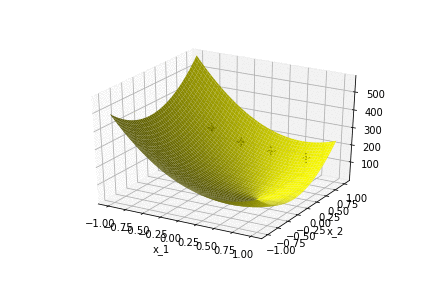

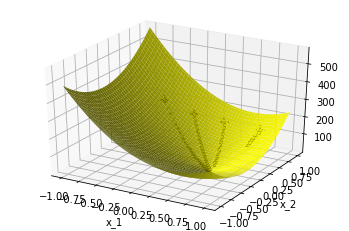

In [ ]:
# Parameters to feed the SGD.
params = (
    {'w_start': [0.7, 0.8], 'eta': 0.00001},
    { 'w_start': [0.2, 0.8], 'eta': 0.00005},
    {'w_start': [-0.2, 0.7], 'eta': 0.0001},
    {'w_start': [-0.6, 0.6], 'eta': 0.0002},
)
N_epochs = 100
FR = 2

# Go!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR, ms=2)
anim.save('animation5.gif', fps=30, writer='imagemagick')
Image(open('animation5.gif','rb').read())

Clearly, a big step size results in fast convergence! Why don't we just set eta to a really big value, then? Say, eta=1?

(Again, note that the FR is lower for this animation.)

SGD function result:[40.66613423668423, 38.144339142431384, 35.7855649050729, 33.57926074095157, 31.51531133611656, 29.58466608054486, 27.778617122087073, 26.089043190456874, 24.508565882234045, 23.0304973963943, 21.647379193966312, 20.353853892731887, 19.143976557961874, 18.011907028273253, 16.95311687653491, 15.962795281510871, 15.036201912063857, 14.169449811469406, 13.358482683676574, 12.600174556761152, 11.890671250428401, 11.227111138980838, 10.606347743799667, 10.025565138583215, 9.482422785258562, 8.97409536568704, 8.498844012256862, 8.054127303120517, 7.638146963780306, 7.249034701371767, 6.885033593811521, 6.544659670475108, 6.226186569443011, 5.928189198243007, 5.649527238682032, 5.388753703904548, 5.144823187189969, 4.916659604278451, 4.70315160881203, 4.5034714244272305, 4.3166669312475, 4.142034095865038, 3.9785784446074333, 3.8257790250635173, 3.6828285715021276, 3.549087547491948, 3.4239653394084324, 3.3069594822427173, 3.197421852535767, 3.0948977722603015, 2.999063137

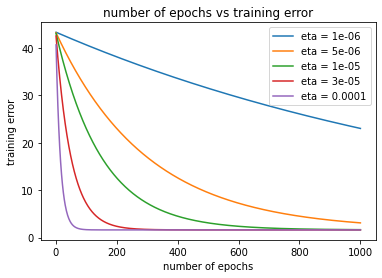

In [ ]:
'''Plotting SGD convergence'''

#==============================================
# TODO: For the given learning rates, plot the
# loss for each epoch.
#==============================================

eta_vals = [1e-6, 5e-6, 1e-5, 3e-5, 1e-4]
w_start = [0.01, 0.01]
N_epochs = 1000

losses_results = []

for i in range(len(eta_vals)):
  W,losses = SGD(X1, Y1, w_start, eta_vals[i], N_epochs)
  losses_results.append(losses)

for i in range(len(losses_results)):
  plt.plot(np.linspace(1,N_epochs,N_epochs),losses_results[i], label = "eta = " + str(eta_vals[i]))

print("SGD function result:" + str(losses))
plt.legend()
plt.xlabel("number of epochs")
plt.ylabel("training error")
plt.title("number of epochs vs training error")
plt.show()


Just for fun, let's try eta=10 as well. What happens? (Hint: look at W)

In [ ]:
# Parameters to feed the SGD.
w_start = [0.01, 0.01]
eta = 10
N_epochs = 100

# Presto!
W, losses = SGD(X1, Y1, w_start, eta, N_epochs)

<ipython-input-3-2964e2225773>:72: RuntimeWarning: overflow encountered in multiply
  w = w - eta * gradient(X[j], Y[j], w)
<ipython-input-3-2964e2225773>:72: RuntimeWarning: invalid value encountered in subtract
  w = w - eta * gradient(X[j], Y[j], w)


# Extra Visualization (not part of the homework problem)
One final visualization! What happens if the loss function has multiple optima?

Performing SGD with parameters {'w_start': [0.9, 0.9], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [0.0, 0.0], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [-0.8, 0.6], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [-0.8, -0.6], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [-0.4, -0.3], 'eta': 0.01} ...

Animating...


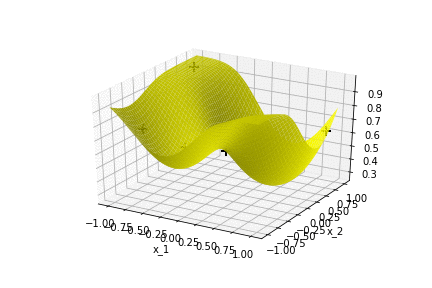

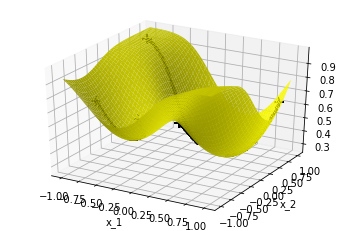

In [ ]:
import urllib.request
urllib.request.urlretrieve('https://raw.githubusercontent.com/emiletimothy/Caltech-CS155-2023/main/set1/src/sgd_multiopt_helper.py', 'sgd_multiopt_helper.py')

# Import different SGD & loss functions.
# In particular, the loss function has multiple optima.
from sgd_multiopt_helper import SGD, loss

# Parameters to feed the SGD.
params = (
    {'w_start': [0.9, 0.9], 'eta': 0.01},
    { 'w_start': [0.0, 0.0], 'eta': 0.01},
    {'w_start': [-0.8, 0.6], 'eta': 0.01},
    {'w_start': [-0.8, -0.6], 'eta': 0.01},
    {'w_start': [-0.4, -0.3], 'eta': 0.01},
)
N_epochs = 100
FR = 2

# One more time!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR, ms=2)
anim.save('animation7.gif', fps=30, writer='imagemagick')
Image(open('animation7.gif','rb').read())